In [2]:
from nilearn import plotting, image, connectome
import nibabel as nib
import os
import numpy as np
from pathlib import Path
import tarfile
import seaborn as sns
import matplotlib.pyplot as plt

import os
os.environ["MKL_VERBOSE"] = "0"


Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# Setup

### Preperation for the brain region
##### After testing each reference for atlases, We discover that the one from `harvard_oxford` is the most comprehensive and suitable for our project

In [104]:
from nilearn import image, plotting
from atlasreader.atlasreader import read_atlas_peak

"""
available reference atlases
---------------------------
    "aal",
    "aicha",
    "desikan_killiany",
    "destrieux",
    "harvard_oxford",
    "juelich",
    "marsatlas",
    "neuromorphometrics",
    "talairach_ba",
    "talairach_gyrus",
 """

atlas = image.threshold_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d15.ica/melodic_IC_sum.nii.gz", "99.5%") 
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
brain_region = []
print("BRAIN REGIONS:\n--------------")
for atlas_coord in atlas_coords:
    region = read_atlas_peak("harvard_oxford", atlas_coord)
    print(region)
    brain_region += [region]

BRAIN REGIONS:
--------------
[[47.0, 'Right_Occipital_Pole'], [23.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[90.0, 'Left_Lateral_Occipital_Cortex_superior_division']]
[[73.0, 'Right_Occipital_Pole']]
[[58.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[57.0, 'Left_Lateral_Occipital_Cortex_superior_division']]
[[75.0, 'Left_Supramarginal_Gyrus_anterior_division'], [8.0, 'Left_Supramarginal_Gyrus_posterior_division'], [6.0, 'Left_Parietal_Operculum_Cortex']]
[[56.0, 'Right_Angular_Gyrus'], [29.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[8.0, 'Right_Occipital_Fusiform_Gyrus']]
[[77.0, 'Right_Lateral_Occipital_Cortex_superior_division']]
[[39.0, 'Left_Supramarginal_Gyrus_posterior_division'], [31.0, 'Left_Angular_Gyrus']]
[[37.0, 'Left_Postcentral_Gyrus'], [28.0, 'Left_Supramarginal_Gyrus_anterior_division'], [8.0, 'Left_Superior_Parietal_Lobule']]
[[26.0, 'Right_Supracalcarine_Cortex'], [23.0, 'Right_Intracalcarine_Cortex'], [13.0, 'Right_Lingual_Gy

In [105]:
#select the correct region with largest probability given from the library
brain_region = [
    max(inner_list, key=lambda x: x[0])[-1] if inner_list else None for inner_list in brain_region
]
brain_region

['Right_Occipital_Pole',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Right_Occipital_Pole',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_anterior_division',
 'Right_Angular_Gyrus',
 'Right_Occipital_Fusiform_Gyrus',
 'Right_Lateral_Occipital_Cortex_superior_division',
 'Left_Supramarginal_Gyrus_posterior_division',
 'Left_Postcentral_Gyrus',
 'Right_Supracalcarine_Cortex',
 'Left_Precentral_Gyrus',
 'Left_Angular_Gyrus',
 'Left_Precuneous_Cortex']

Reading and loading the data for each subject into the array subject called `all_data`. This is an array subject with the shape of (1003, 4800, 15), which 1003 is the number of subject, 4800 is the number of data we have, and 15 is the number of brain region.

In [108]:
folder = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d15_ts2'
#looping through the folder
all_files = [f for f in os.listdir(folder) if f.endswith('.txt')]
all_data = []

for filename in all_files:
    file_path = os.path.join(folder, filename)
    subject_data = np.loadtxt(file_path)
    all_data.append(subject_data)

all_data = np.array(all_data)

In [107]:
all_data.shape

(1003, 4800, 15)

### Sliding Window Analysis

##### create sliding windows for all subject. 
a sliding window is that we intentionally make 50% overlap for each group we created

At first, we wish to see the general differences and changes for dynamic connections between regions in the brain. In order to start from the easy part, we fixed it into four windows


In [55]:
#copy the data and create prepration
data = all_data
average_corr_matrices = []
time_per_group = data.shape[1] // 4

#for loop to get sliding windows for each subject, then average them ahead and return 4 averaged correlation matrices divided by their windows
for group_idx in range(4):
    subject_corr_matrices = []
    #select group and window
    start_time = group_idx * time_per_group
    end_time = start_time + time_per_group
    sub_matrix = data[:, start_time:end_time, :]
    #select the windows for each subject by looping through them
    for person_idx in range(data.shape[0]):
        subgroup_data = sub_matrix[person_idx, :, :]
        #calculate correlation matrix
        corr_matrix = np.corrcoef(subgroup_data.T)
        #append it into the correlated array for each window
        subject_corr_matrices.append(corr_matrix)
    #took average
    average_corr_matrix = np.mean(subject_corr_matrices, axis=0)
    
    average_corr_matrices.append(average_corr_matrix)
    

average_corr_matrices = np.array(average_corr_matrices)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


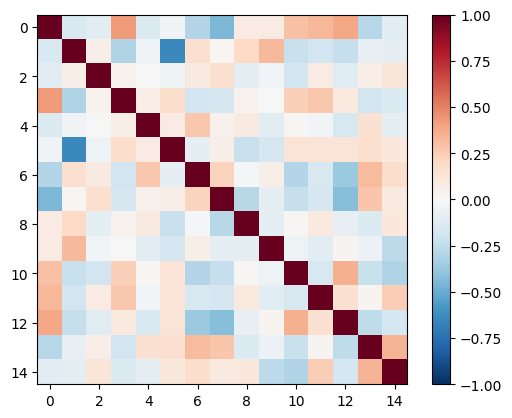

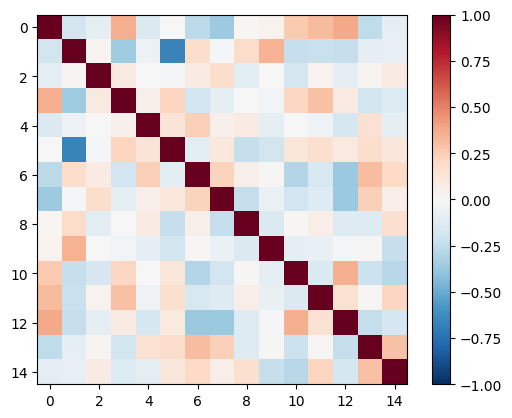

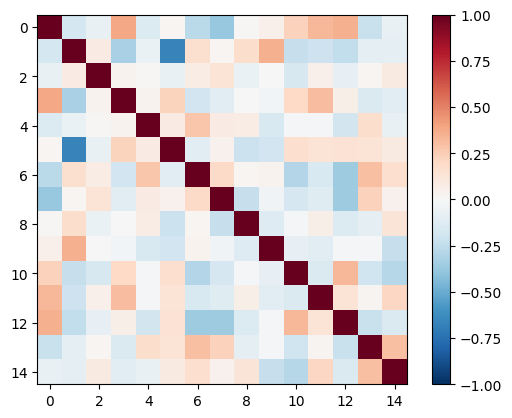

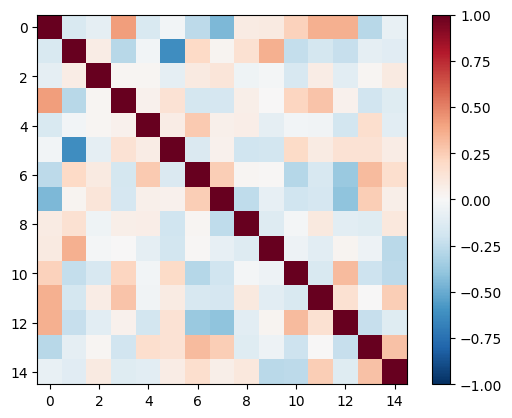

In [57]:
#using a for loop to plot the correlation matrix for each sliding window
for sub_corr_matrix in average_corr_matrices:
    plt.figure()
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none", vmin = -1, vmax = 1)
    plt.colorbar()
    plt.show()

### whole graph for sliding window correlation for all subjects

For this part, we decided to go for the bigger picture that we created a function that generates 7 sliding window correlation matrices as defualt for all regions. This function used 50% overlap for the sliding windows which helps us to see the dynamic connections clearly.

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


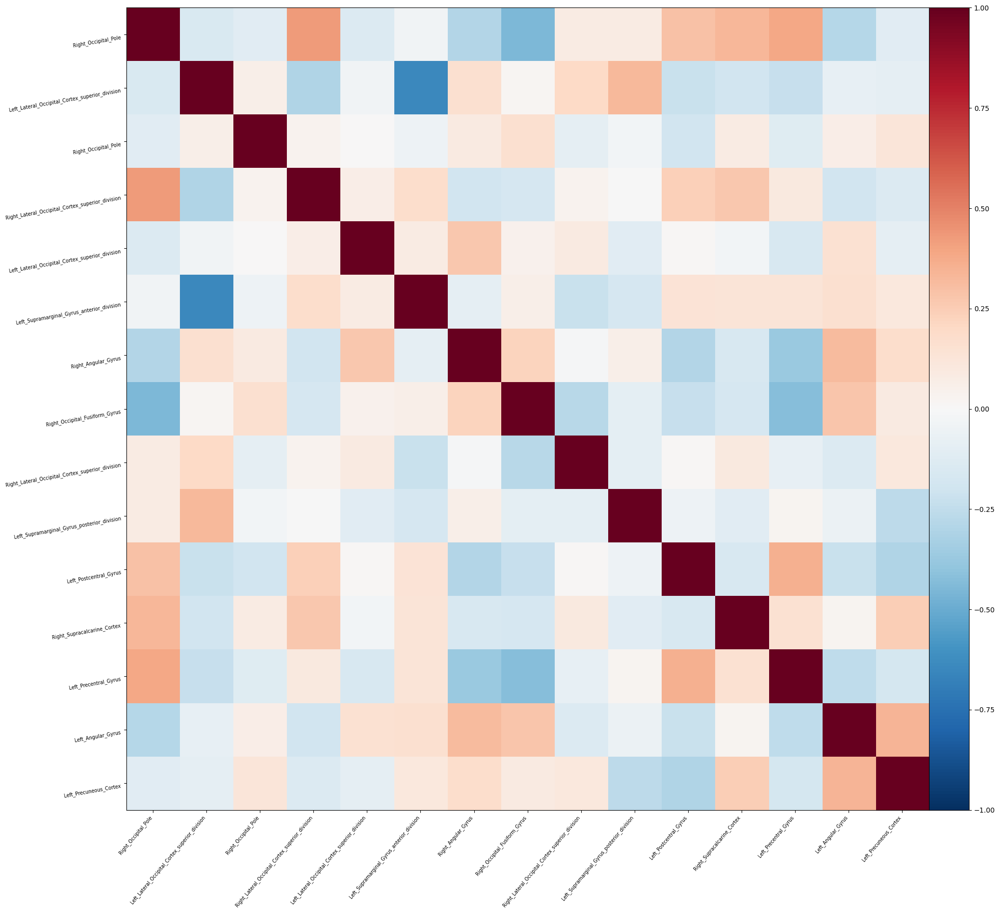

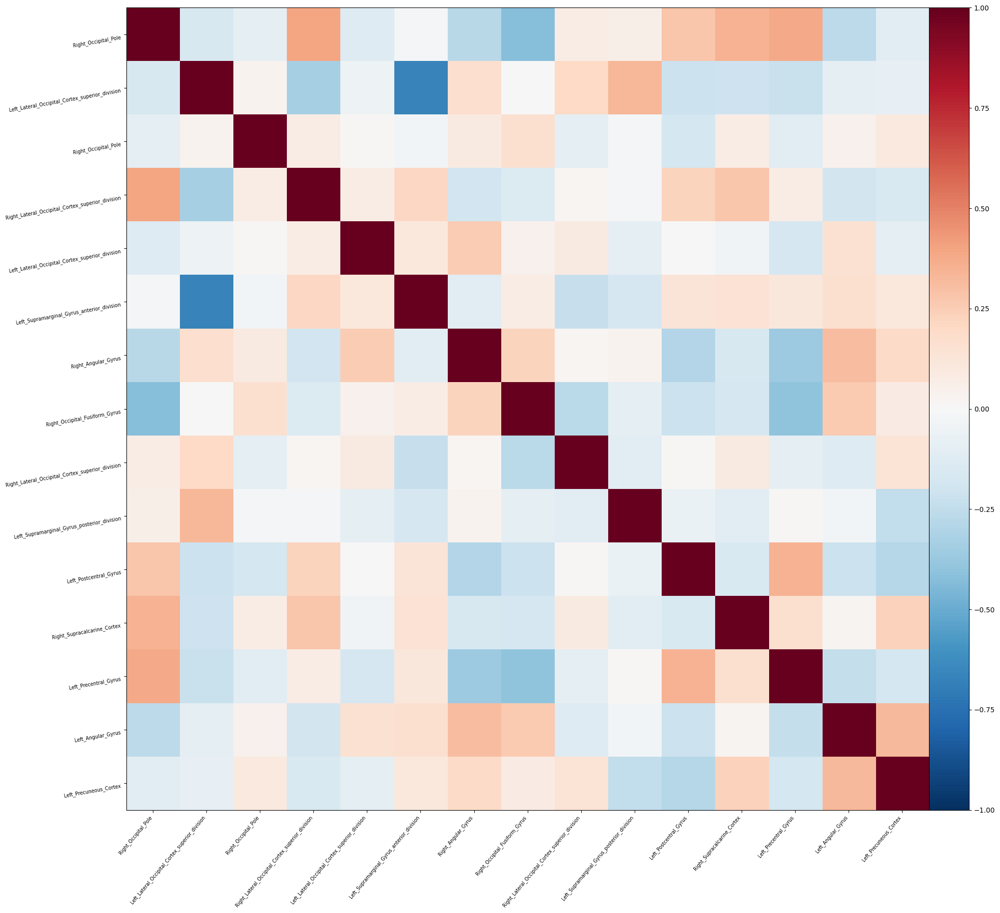

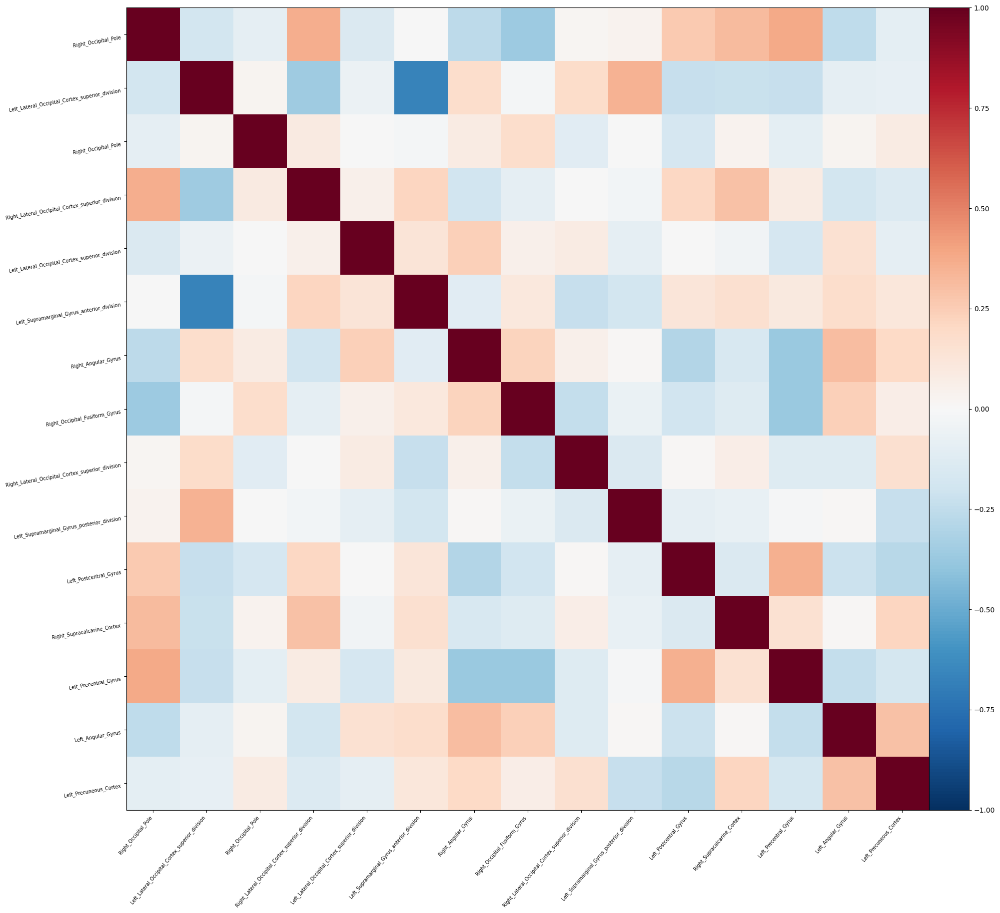

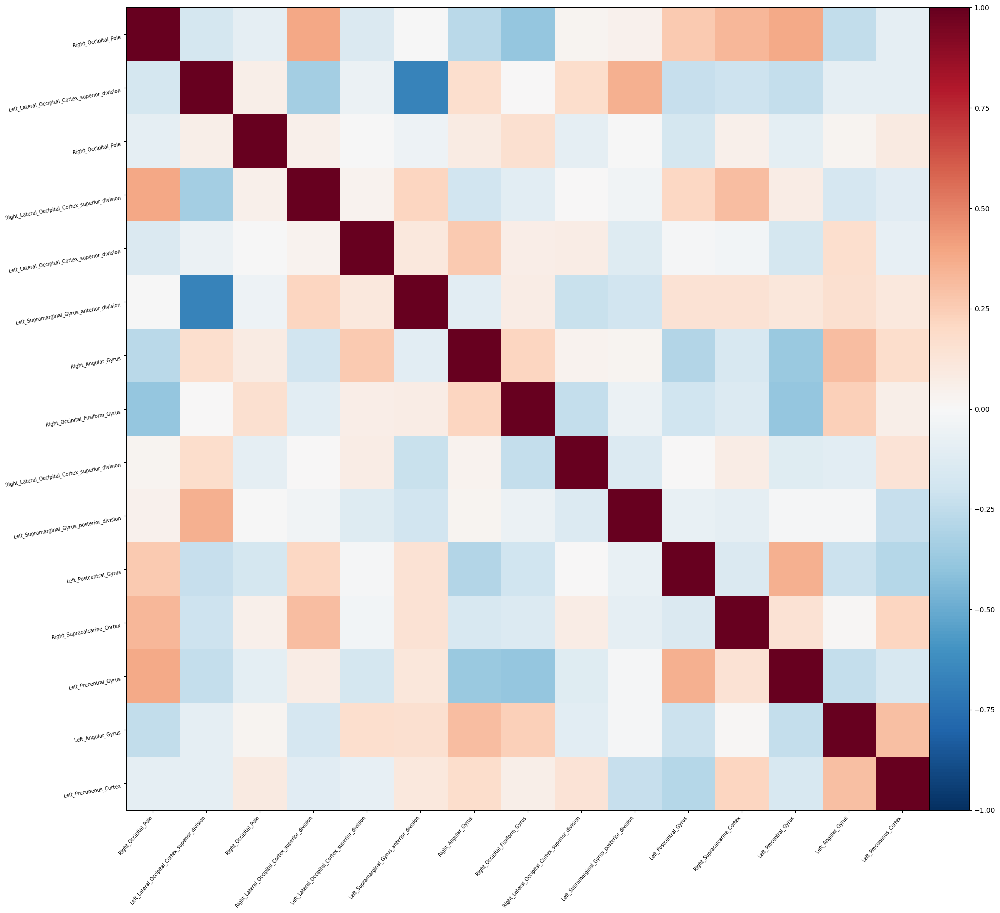

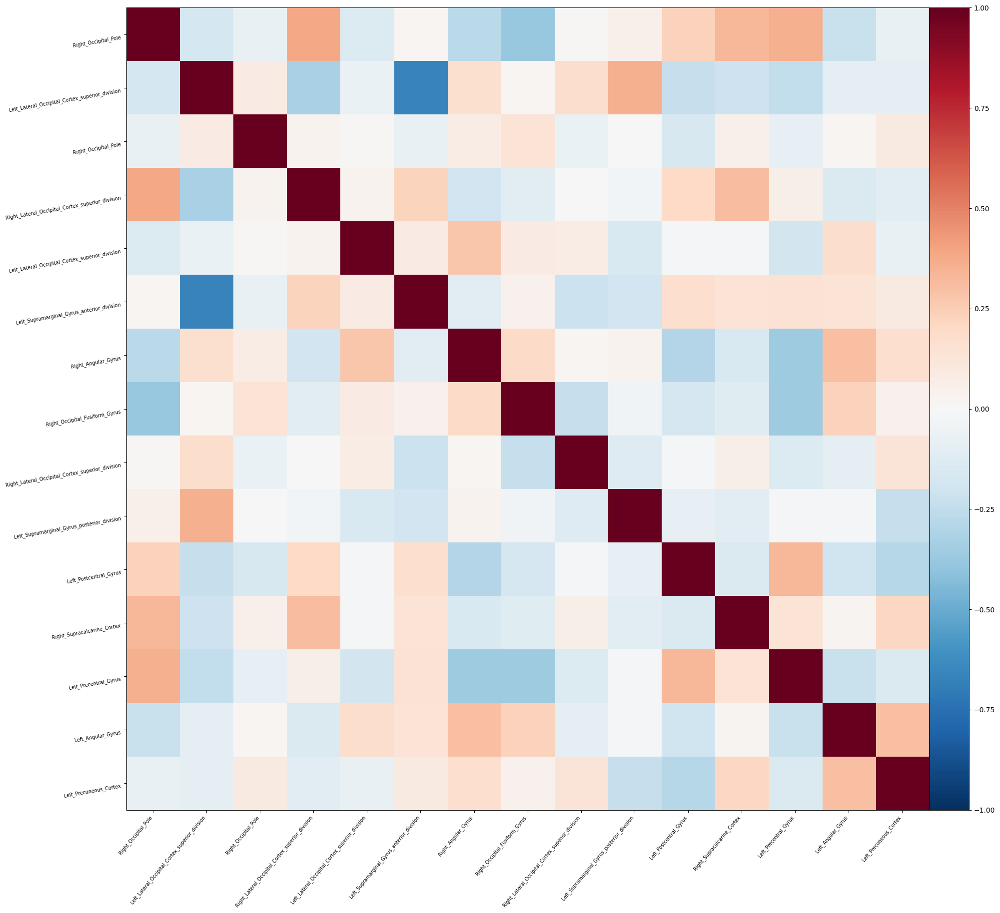

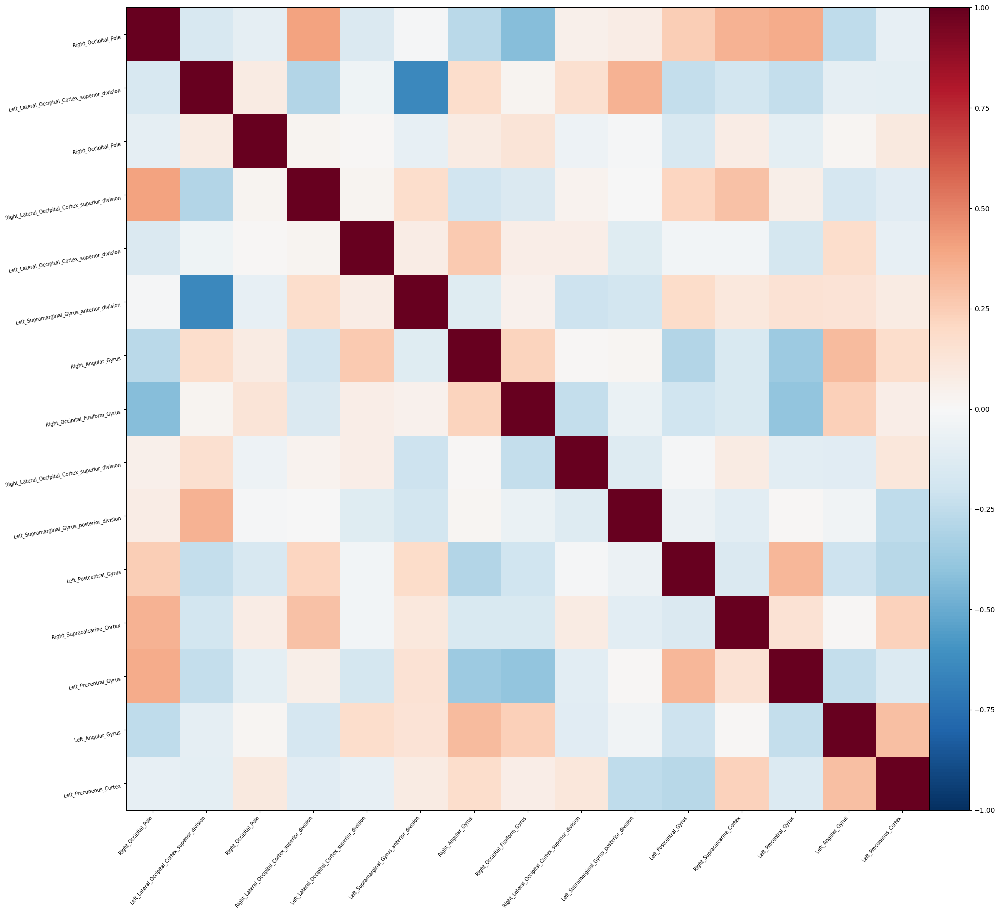

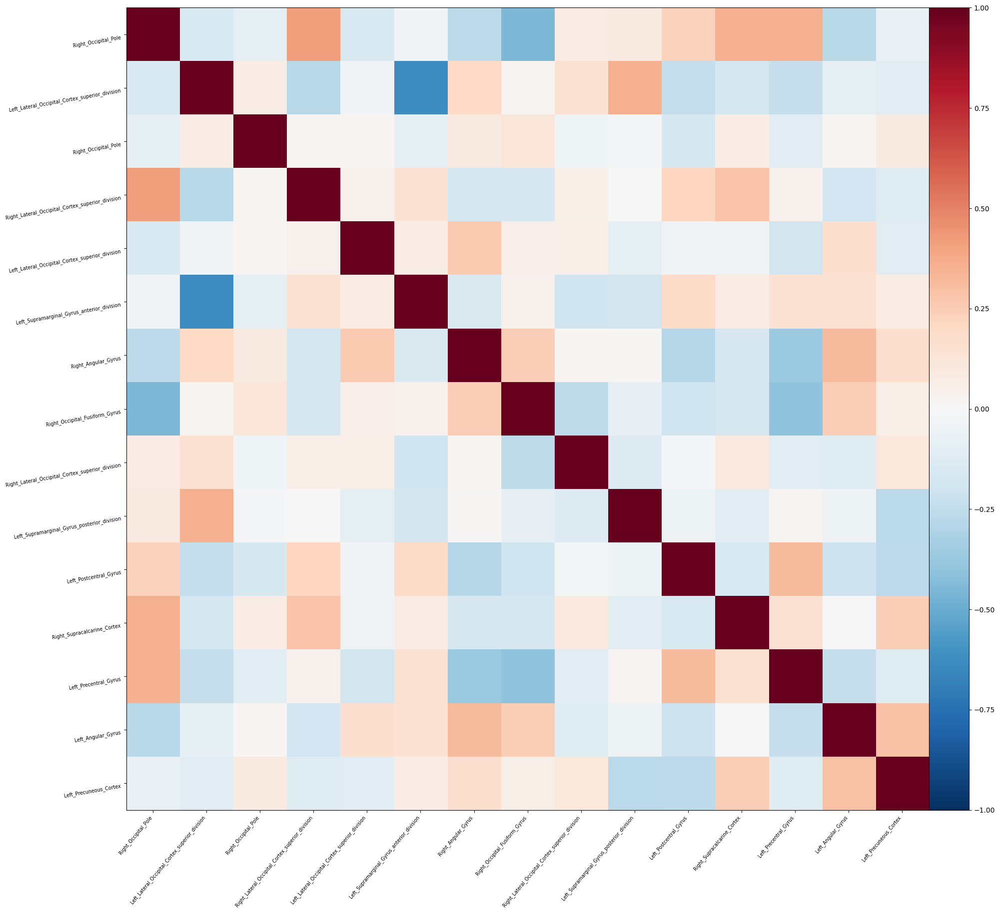

In [58]:
def sliding_window_corr(data, region=None,time_per_group=None, overlap=None):
    #defualt settings
    if time_per_group is None:
        time_per_group = data.shape[1] // 4 
    if overlap is None:
        overlap = time_per_group // 2 
    
    #setup for default 50% overlap
    num_windows = (data.shape[1] - overlap) // overlap
    
    average_corr_matrices_slid = []
    #looping through the data and seperate them into different windows
    for group_idx in range(num_windows):
        subject_corr_matrices_slid = []
        
        start_time = group_idx * overlap
        end_time = start_time + time_per_group
        
        sub_matrix = data[:, start_time:end_time, :]
        #looping through each subject and grouping them into different windows
        for person_idx in range(data.shape[0]):
            #cases for different condition (regions)
            if region is None:
                subgroup_data = sub_matrix[person_idx, :, :]
            else:
                subgroup_data = sub_matrix[person_idx, :, region[0]:region[-1]]
            #create correlation matrix
            corr_matrix = np.corrcoef(subgroup_data.T)
            subject_corr_matrices_slid.append(corr_matrix)
        
        average_corr_matrix_slid = np.mean(subject_corr_matrices_slid, axis=0)
        
        average_corr_matrices_slid.append(average_corr_matrix_slid)
    #adjust the region for plots
    if region is not None:
        ranged_brain_region = brain_region[region[0]:region[-1]]
    else:
        ranged_brain_region = brain_region
    #using plotting package to plot the correlation matrix for each sliding window
    for sub_corr_matrix in average_corr_matrices_slid:
        plotting.plot_matrix(sub_corr_matrix, labels = ranged_brain_region, cmap = "RdBu_r", figure = (3, 3), vmin=-1, vmax=1);   
    #returing an array of result of shape of (7, 15, 15) along with the region labels
    return average_corr_matrices_slid, ranged_brain_region

   

data = all_data
average_corr_matrices_slid_all = sliding_window_corr(data)
average_corr_matrices_slid = average_corr_matrices_slid_all[0]
ranged_brain_region = average_corr_matrices_slid_all[1]


#### Interactive plots
in order to see the changes and dynamics clearly, we made the sliding windows a interactive plot by the timeseries

In [60]:
import plotly.graph_objects as go
#getting the index of the regions
brain_region_index = [f"Region {i+1}" for i in range(15)]
#construct the initial plot
fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)
#construct the following plots 
frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames
#setting up the basic plot
fig.update_layout(
    title="Brain Connectivity Over Time (100 x 100 Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=1200,
    height=1200,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid))
        ]
    }]
)

fig.show()


In [ ]:
#we can divived into regions to demonstrate some results

### Close Up Look for the Correlation Matrix
After the analysis for the whole picture, we indeed see some changes, but the plot above contains numbers of noises. So we want to see the subregions of each large region. Therefore, we edited the previous function that allows us to select the targeted region and create a time series sliding window on it. this function is for the divided brain region as we wished for close up analysis in each brain area

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


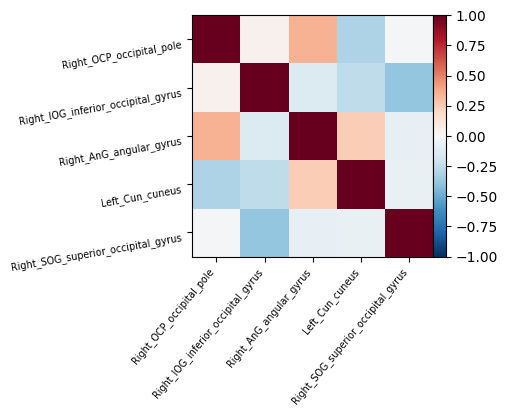

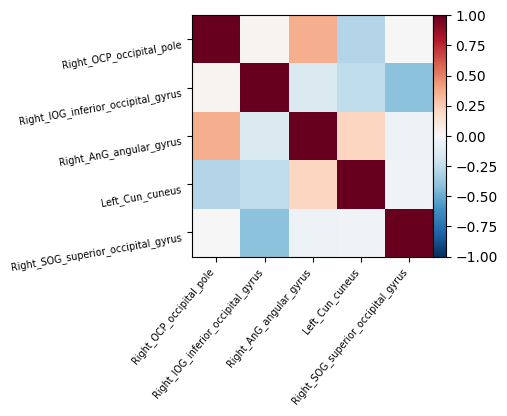

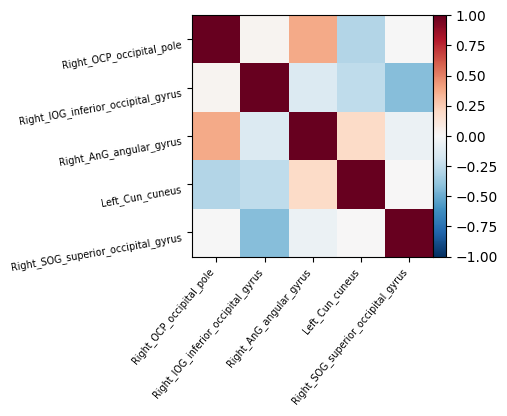

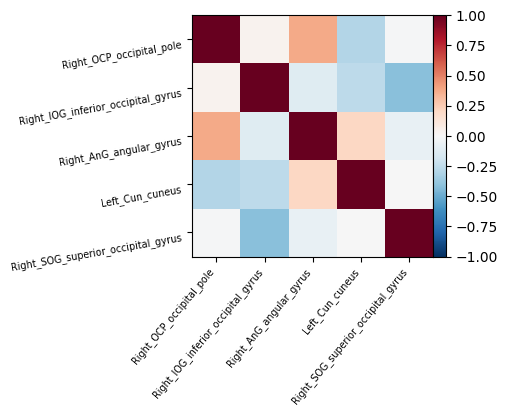

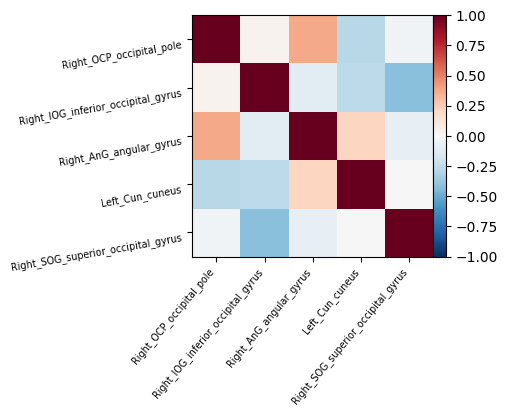

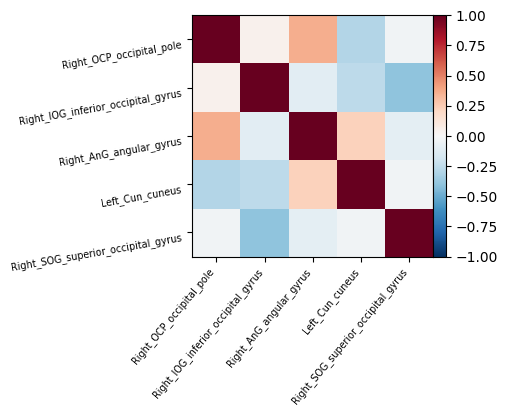

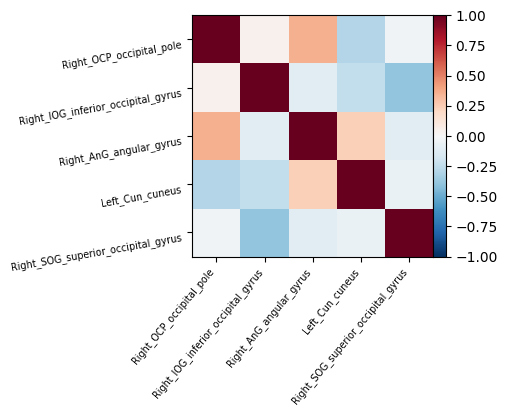

In [13]:
data = all_data
average_corr_matrices_slid_all = sliding_window_corr(data, region=[0, 5])
average_corr_matrices_slid = average_corr_matrices_slid_all[0]
ranged_brain_region = average_corr_matrices_slid_all[1]

In [14]:
#setup for the region index
brain_region_index = [f"Region {i+1}" for i in range(len(average_corr_matrices_slid[0]))]
#create basic figure and the first plot
fig = go.Figure(
    data=go.Heatmap(
        z=average_corr_matrices_slid[0], 
        x=brain_region_index,
        y=brain_region_index,
        colorscale="RdBu_r",
        zmin=-1,
        zmax=1,
        colorbar=dict(title="Correlation", titleside="right", thickness=20)
    )
)
#construct following plots
frames = [
    go.Frame(
        data=go.Heatmap(
            z=matrix,
            x=brain_region_index,
            y=brain_region_index,
            colorscale="RdBu_r",
            zmin=-1,
            zmax=1
        ),
        name=f"Window {i+1}"
    )
    for i, matrix in enumerate(average_corr_matrices_slid)
]

fig.frames = frames
#setup for the layout
fig.update_layout(
    title=f"Brain Connectivity Over Time ({len(average_corr_matrices_slid[0])} x {len(average_corr_matrices_slid[0])} Matrix)",
    xaxis_title="Brain Region",
    yaxis_title="Brain Region",
    xaxis_nticks=len(brain_region),
    yaxis_nticks=len(brain_region),
    width=700,
    height=700,
    font=dict(size=10), 
    updatemenus=[
        {
            "type": "buttons",
            "showactive": False,
            "buttons": [
                {
                    "label": "Play",
                    "method": "animate",
                    "args": [None, {"frame": {"duration": 500, "redraw": True}, "fromcurrent": True}]
                },
                {
                    "label": "Pause",
                    "method": "animate",
                    "args": [[None], {"frame": {"duration": 0, "redraw": True}, "mode": "immediate"}]
                }
            ]
        }
    ],
    sliders=[{
        "active": 0,
        "yanchor": "top",
        "xanchor": "left",
        "currentvalue": {"prefix": "Time Window: ", "font": {"size": 20}},
        "pad": {"b": 10, "t": 50},
        "len": 0.9,
        "x": 0.1,
        "y": 0,
        "steps": [
            {"args": [[f"Window {i+1}"], {"frame": {"duration": 300, "redraw": True}, "mode": "immediate"}],
             "label": f"{i+1}", "method": "animate"}
            for i in range(len(average_corr_matrices_slid))
        ]
    }]
)

fig.show()
print(ranged_brain_region)

['Right_OCP_occipital_pole', 'Right_IOG_inferior_occipital_gyrus', 'Right_AnG_angular_gyrus', 'Left_Cun_cuneus', 'Right_SOG_superior_occipital_gyrus']


### Show the brain with the connections
After seeing the data and matrices, we decided to learn some method of analysis from the plot or image of the brain

atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 15)


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/numpy/ma/core.py:2826: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/matplotlib/contour.py:1454: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/matplotlib/contour.py:1455: UserWarning:


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/nilearn/plotting/displays/_axes.py:74: UserWarning:

linewidths is ignored by contourf



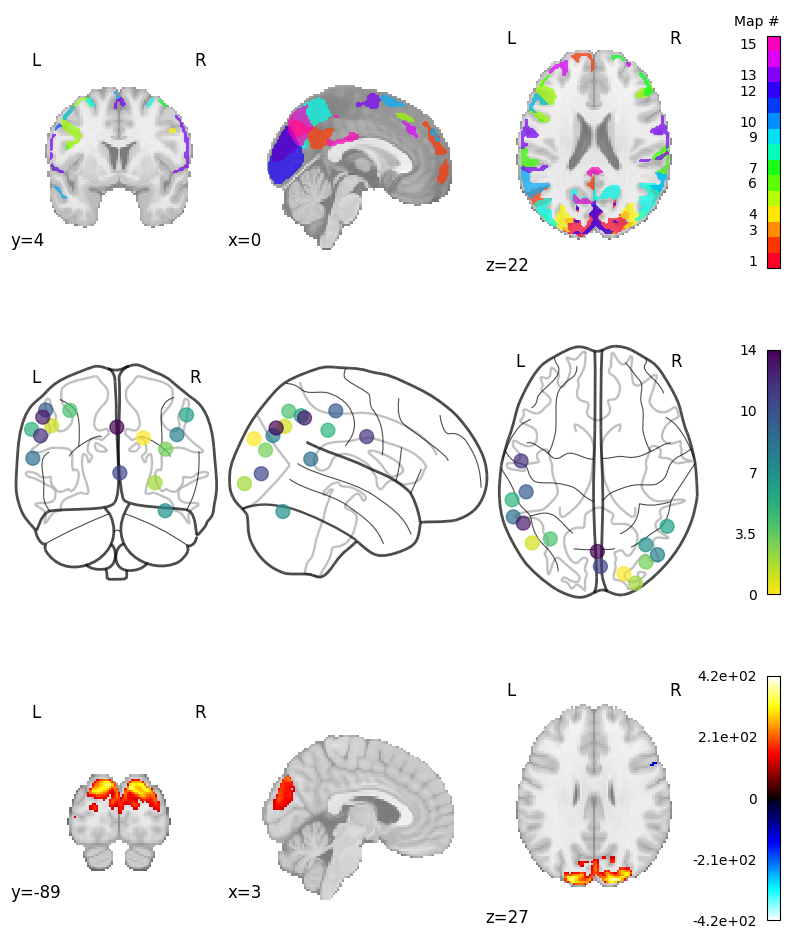

In [65]:
from nilearn import image, plotting
import matplotlib.pyplot as plt
import numpy as np

atlas = image.load_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d15.ica/melodic_IC_sum.nii.gz")
atlas = image.threshold_img(atlas, "99.5%") 
print("atlas has shape", ["x", "y", "z", "region"], "=", atlas.shape)

fig, axs = plt.subplots(nrows=3, figsize=(10, 12))

# plot atlas, all regions
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs[0])

# plot atlas, center coordinates
# get the x,y,z coordinates for each of the regions
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
plotting.plot_markers(node_values=np.arange(15), node_coords=atlas_coords, axes=axs[1])

# plot atlas, one region
idx = 0 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False, axes=axs[2]
)

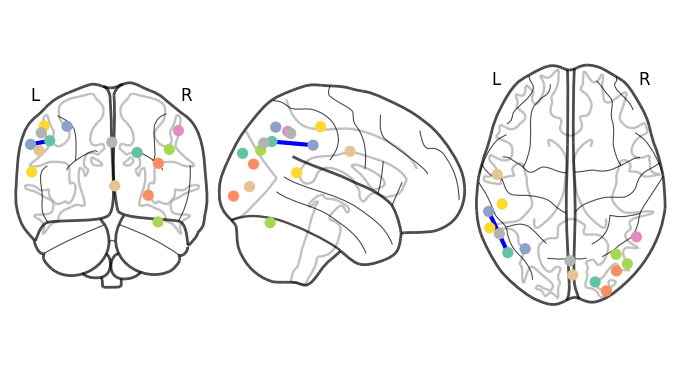

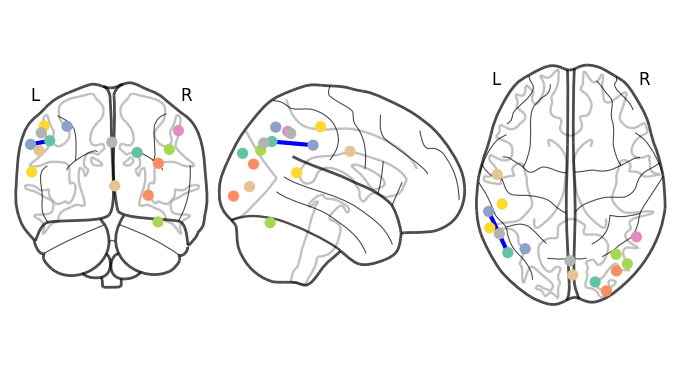

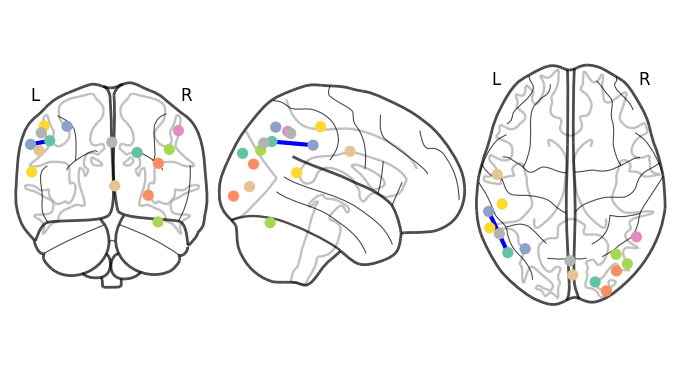

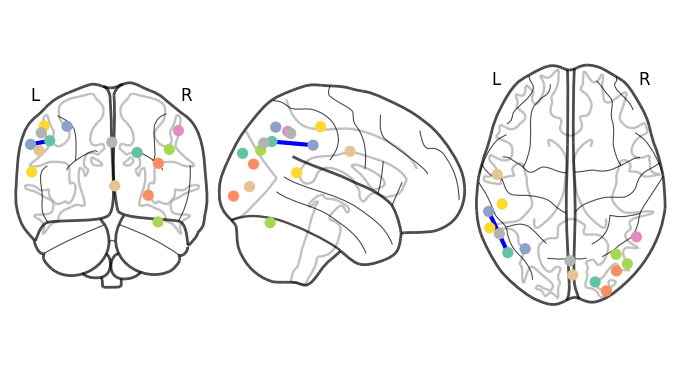

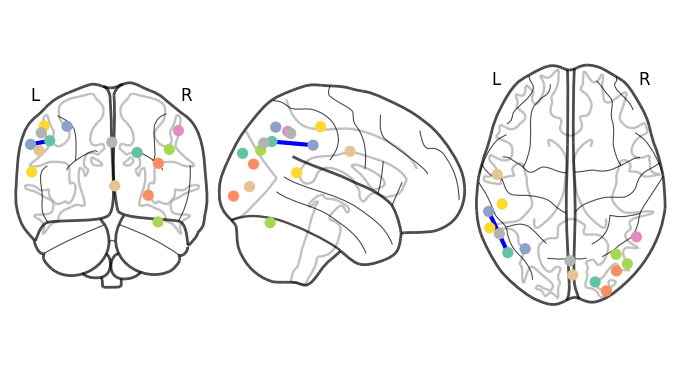

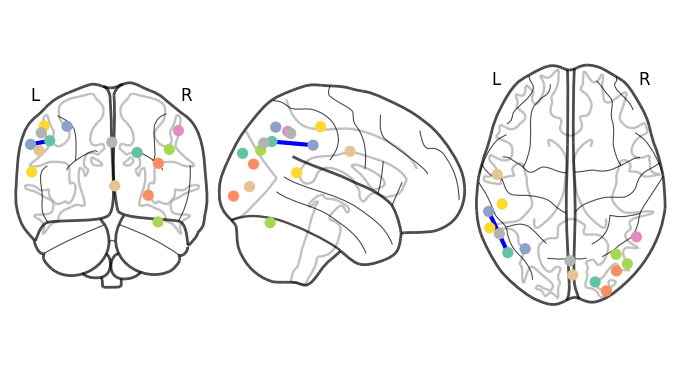

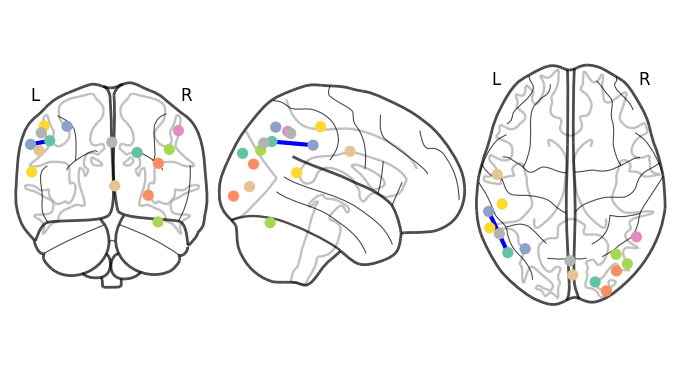

In [66]:
#we used the time series sliding window correlation matrix to plot the correlations
for each_window in average_corr_matrices_slid:
    plotting.plot_connectome(each_window, atlas_coords, edge_threshold="99.9%")

Seeing those connections plot by plot is not appearant for analysis, so we made another interactive plot in html which allows us to see the strength of the correlation, also we can see from each side of the brain and see the changes. This interactive plot allows us more freedom to see the brain. 

In [79]:
view = plotting.view_connectome(average_corr_matrices_slid[6], atlas_coords)
view
#view.save_as_html("brain_sliding_window_6.html")

### find the map with one region vs all other regions

As we have some understandings with the whole brain and all regions, we want to go deeper into how a single region can have correlated with other regions and to see how other regions are paired with this specific region.

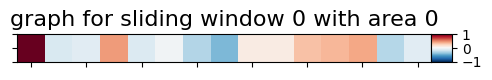

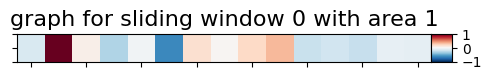

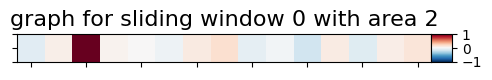

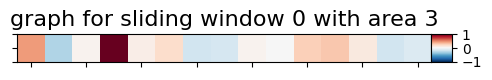

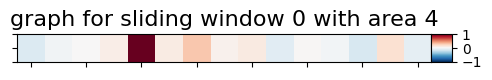

...

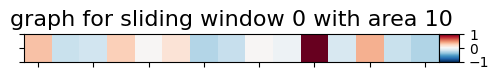

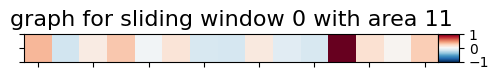

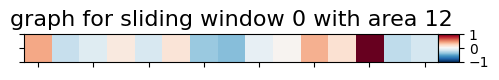

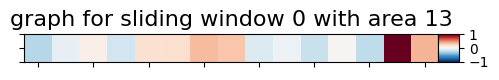

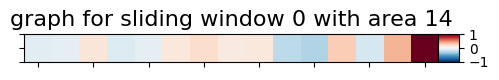

In [102]:
#looping through the sliding correlation matrix
for i in average_corr_matrices_slid:
    count = 0
    #looping in the 15 regions
    for j in range(15):
        plotting.plot_matrix(i[j].reshape(1,15), title = f"graph for sliding window {count} with area {j}", 
        cmap = "RdBu_r", figure = (5, 10), vmin=-1, vmax=1);   
    count += 1
    break

# previous data exploration, you can decide not to include them

100206

explore with the 5 mins as a window

In [6]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100206.txt'
data = np.loadtxt(path_file, dtype=float)
data.shape


(4800, 100)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


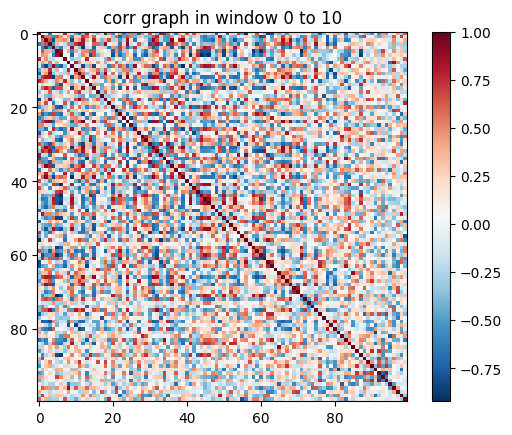

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


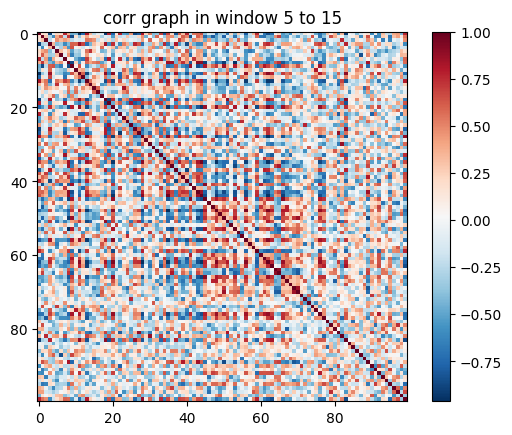

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


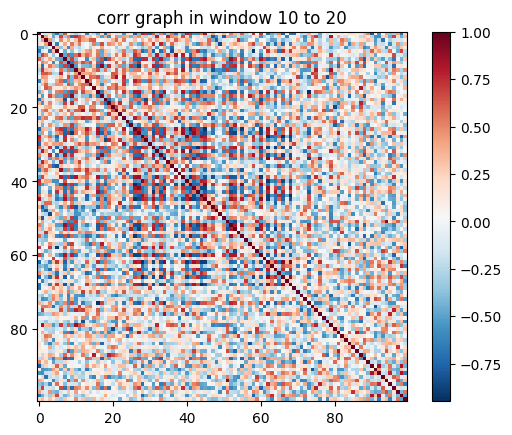

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


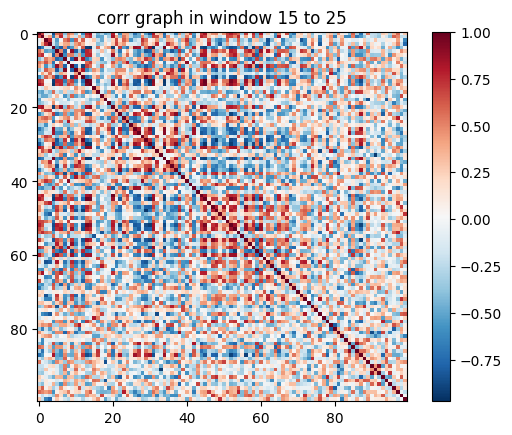

In [74]:
count = 0
for i in range(data.shape[0]):
    if count % 5 != 0:
        count += 1
        continue
    count += 1
    
    sub_data = data[i: i + 10]
    sub_corr_matrix = np.corrcoef(sub_data.T)
    plt.imshow(sub_corr_matrix, cmap="RdBu_r", interpolation="none")
    plt.colorbar()
    plt.title(f"corr graph in window {i} to {i+10}")
    plt.show()

    if i + 5 == 20:
        break

In [41]:
test_data = data[0:10]
result = connectome.ConnectivityMeasure(test_data, kind = "tangent")

In [45]:
result.cov_estimator

(10, 100)

brain view

In [29]:
atlas_region

atlas has shape ['x', 'y', 'z', 'region'] = (91, 109, 91, 100)


/Users/zhuoxuanju/opt/anaconda3/envs/dsc80/lib/python3.8/site-packages/nilearn/plotting/displays/_axes.py:74: UserWarning: No contour levels were found within the data range.
  im = getattr(ax, type)(


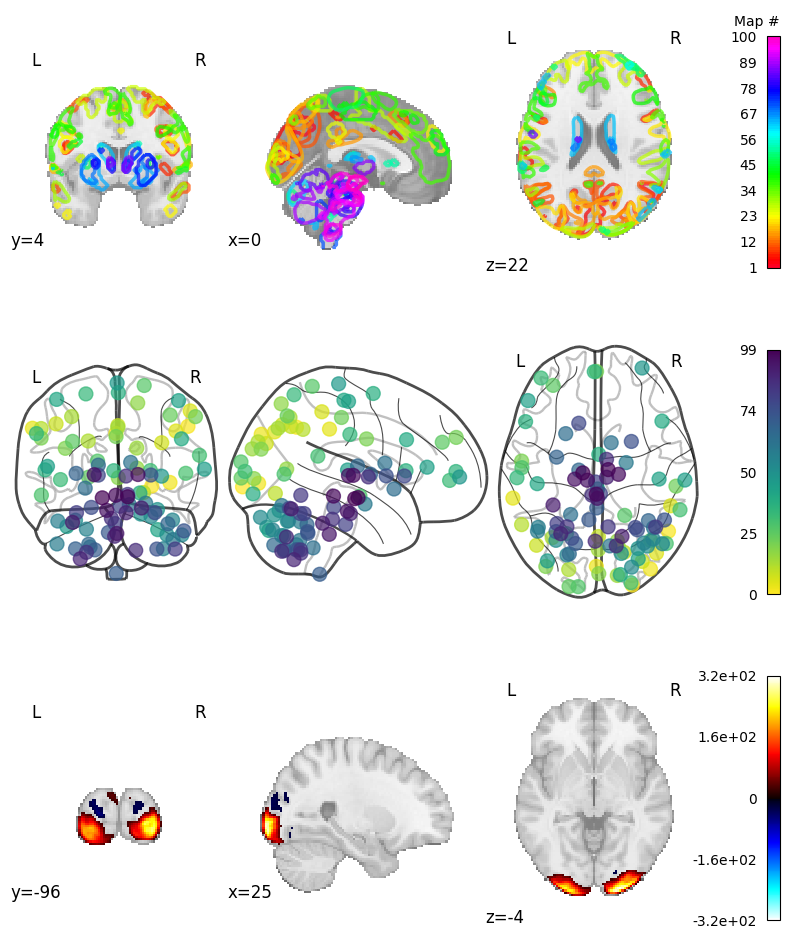

In [40]:
from nilearn import image, plotting
import matplotlib.pyplot as plt
import numpy as np

atlas = image.load_img("HCP_PTN1200/groupICA/groupICA_3T_HCP1200_MSMAll_d100.ica/melodic_IC_sum.nii.gz")
atlas = image.threshold_img(atlas, "99.5%") 
print("atlas has shape", ["x", "y", "z", "region"], "=", atlas.shape)

fig, axs = plt.subplots(nrows=3, figsize=(10, 12))

# plot atlas, all regions
plotting.plot_prob_atlas(atlas, colorbar=True, draw_cross=False, axes=axs[0])

# plot atlas, center coordinates
# get the x,y,z coordinates for each of the regions
atlas_coords = plotting.find_probabilistic_atlas_cut_coords(atlas)
plotting.plot_markers(node_values=np.arange(100), node_coords=atlas_coords, axes=axs[1])

# plot atlas, one region
idx = 0 # first region
atlas_region = image.index_img(atlas, idx)
plotting.plot_stat_map(
    atlas_region, draw_cross=False, axes=axs[2]
)

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


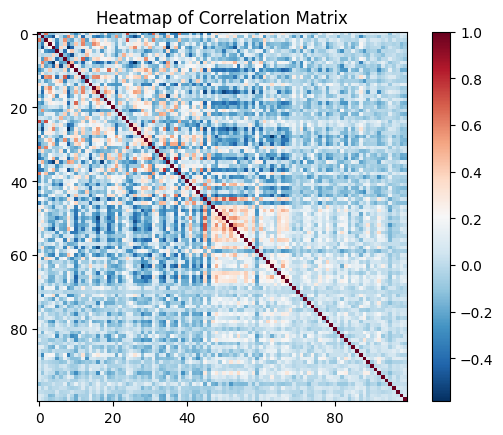

In [73]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100206.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='RdBu_r', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

100307

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


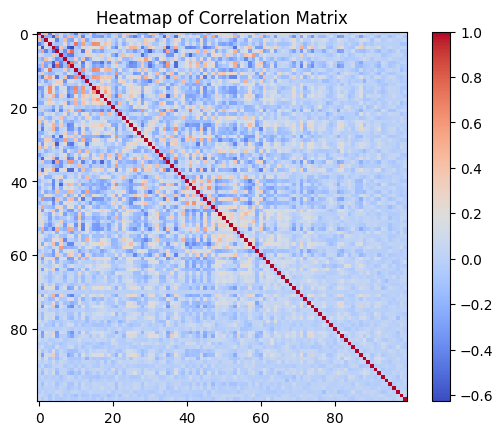

In [5]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100307.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

100408

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


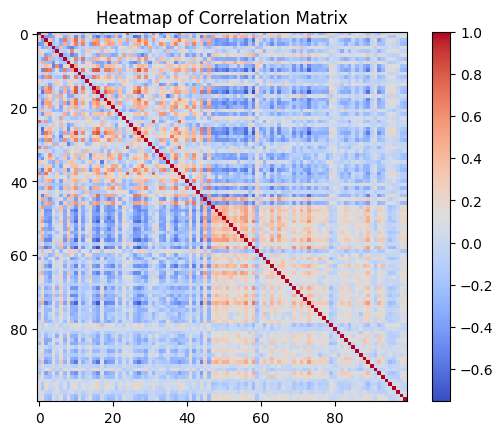

In [6]:
path_file = 'HCP_PTN1200/node_timeseries/3T_HCP1200_MSMAll_d100_ts2/100408.txt'

data = np.loadtxt(path_file, dtype=float)
corr_matrix = np.corrcoef(data.T)
plt.imshow(corr_matrix, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()

make differently

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


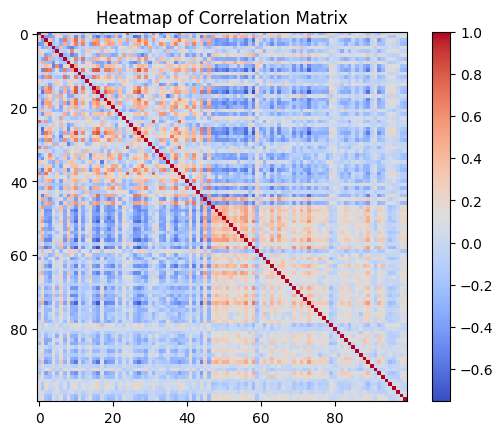

In [7]:
corr = np.corrcoef(data.T)
plt.imshow(corr, cmap='coolwarm', interpolation='none')
plt.colorbar()
plt.title('Heatmap of Correlation Matrix')
plt.show()